# Import dependencies

In [2]:
import numpy as np
import numba
import sklearn.datasets
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import umap.umap_ as umap
import torchvision
import torch
from PIL import Image
import pandas as pd

 ### please refer to inference_umap.py where we saved the LIST of embeddings, labels, and their paths respectively
 

In [4]:
# test with only 50 points each class normally 
embed = torch.load('/proj/rcs-ssd/ll3504/GAN/pixel2style2pixel/exp_out/hyper_styleGANinversion_animals_512_test_50_with_euc/embed')
euc_embed = torch.load('/proj/rcs-ssd/ll3504/GAN/pixel2style2pixel/exp_out/hyper_styleGANinversion_animals_512_test_50_with_euc/euc_embed')
label = torch.load('/proj/rcs-ssd/ll3504/GAN/pixel2style2pixel/exp_out/hyper_styleGANinversion_animals_512_test_50_with_euc/label')
im_path = torch.load('/proj/rcs-ssd/ll3504/GAN/pixel2style2pixel/exp_out/hyper_styleGANinversion_animals_512_test_50_with_euc/image_path')

# UMAP - Hyperbolic

In [ ]:
# create dataframe
df = pd.DataFrame(list(zip(embed, label, im_path)), columns = ['embedding', 'label', 'image_path'])
df['label'] = df['label'].astype('int')

Here we use the default parameter settings of UMAP

In [6]:
hyperbolic_mapper = umap.UMAP(output_metric='hyperboloid',
                              random_state=42).fit(embed)

# for more details, please refer to the original UMAP visualization for hyperbolic space: 
# https://umap-learn.readthedocs.io/en/latest/embedding_space.html

/home/ll3504/anaconda3/envs/psp_env/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


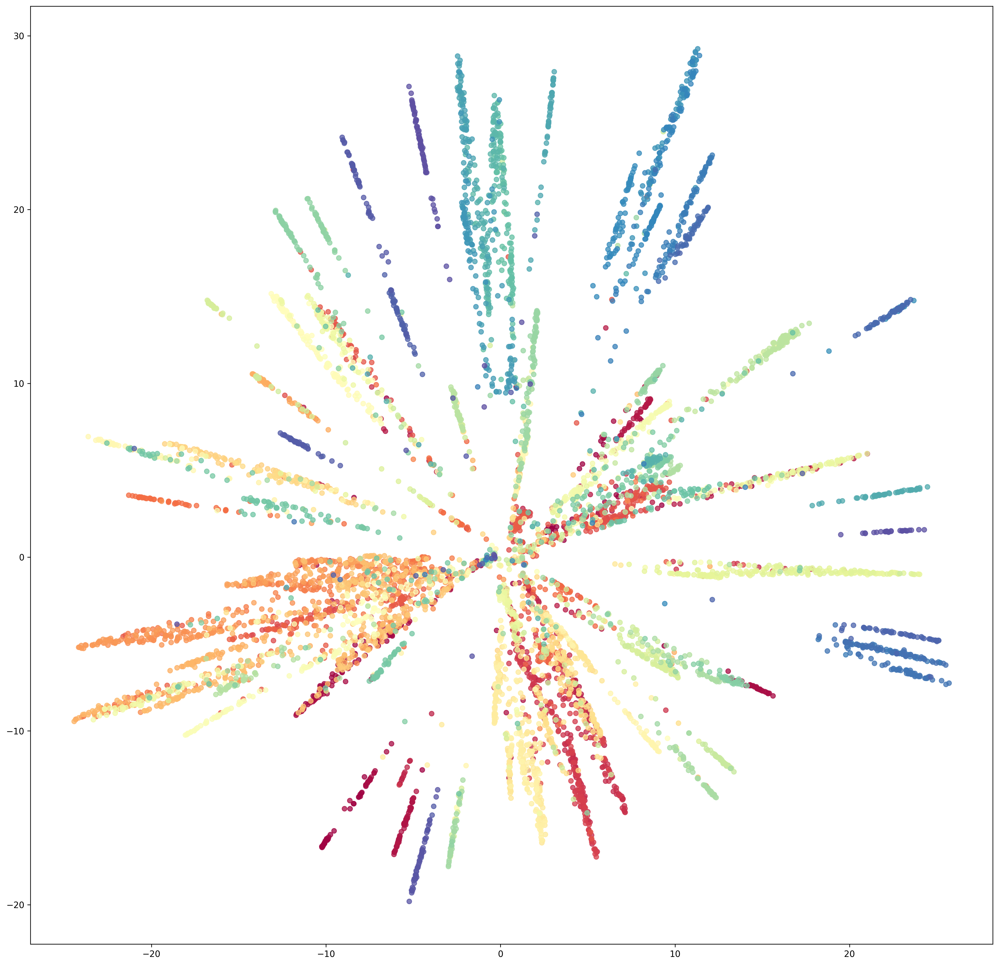

In [7]:
# plot raw hyperbolic embeddings
from matplotlib.pyplot import figure
figure(figsize=(20,20), dpi=300)
plt.scatter(hyperbolic_mapper.embedding_.T[0],
            hyperbolic_mapper.embedding_.T[1],
            c=label, cmap='Spectral', alpha = 0.75, s = 30)

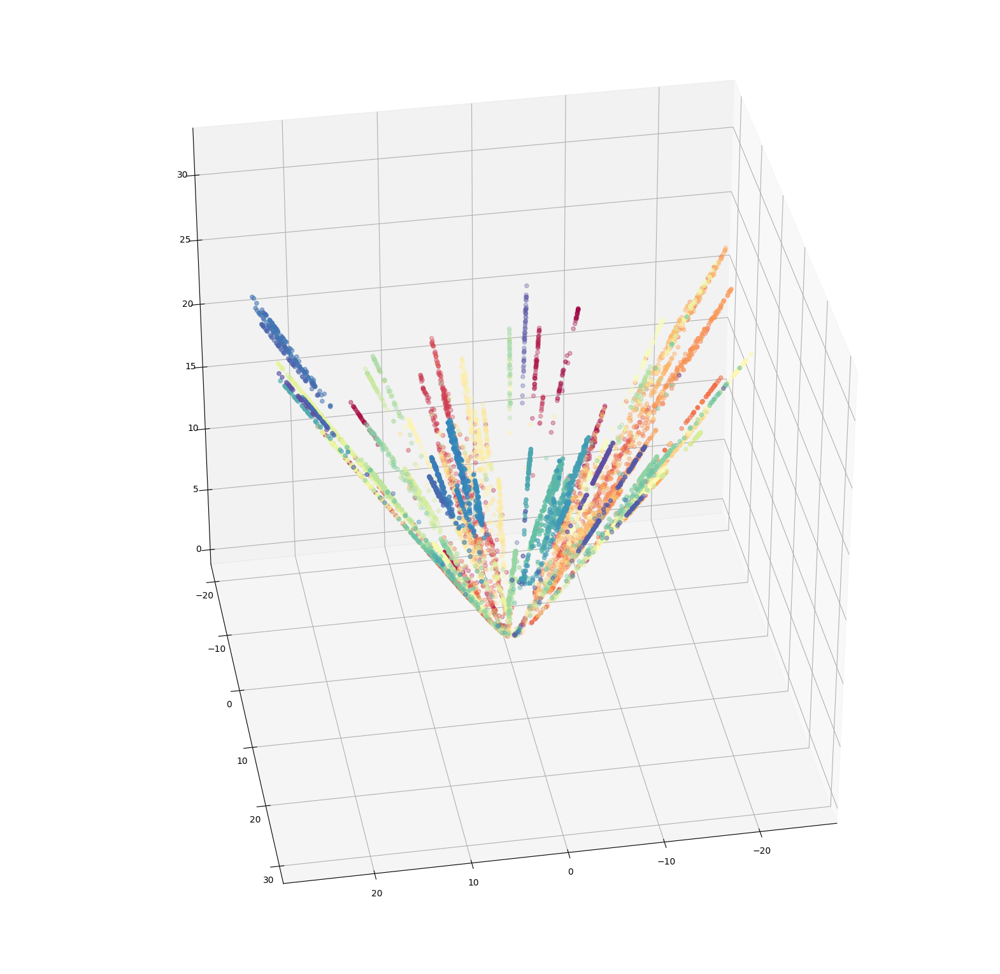

In [9]:
# project the umap back to hyperboloid

x = hyperbolic_mapper.embedding_[:, 0]
y = hyperbolic_mapper.embedding_[:, 1]
z = np.sqrt(1 + np.sum(hyperbolic_mapper.embedding_**2, axis=1))

fig = plt.figure(figsize = (20,20), dpi = 100)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=label, cmap='Spectral')
ax.view_init(35, 80)

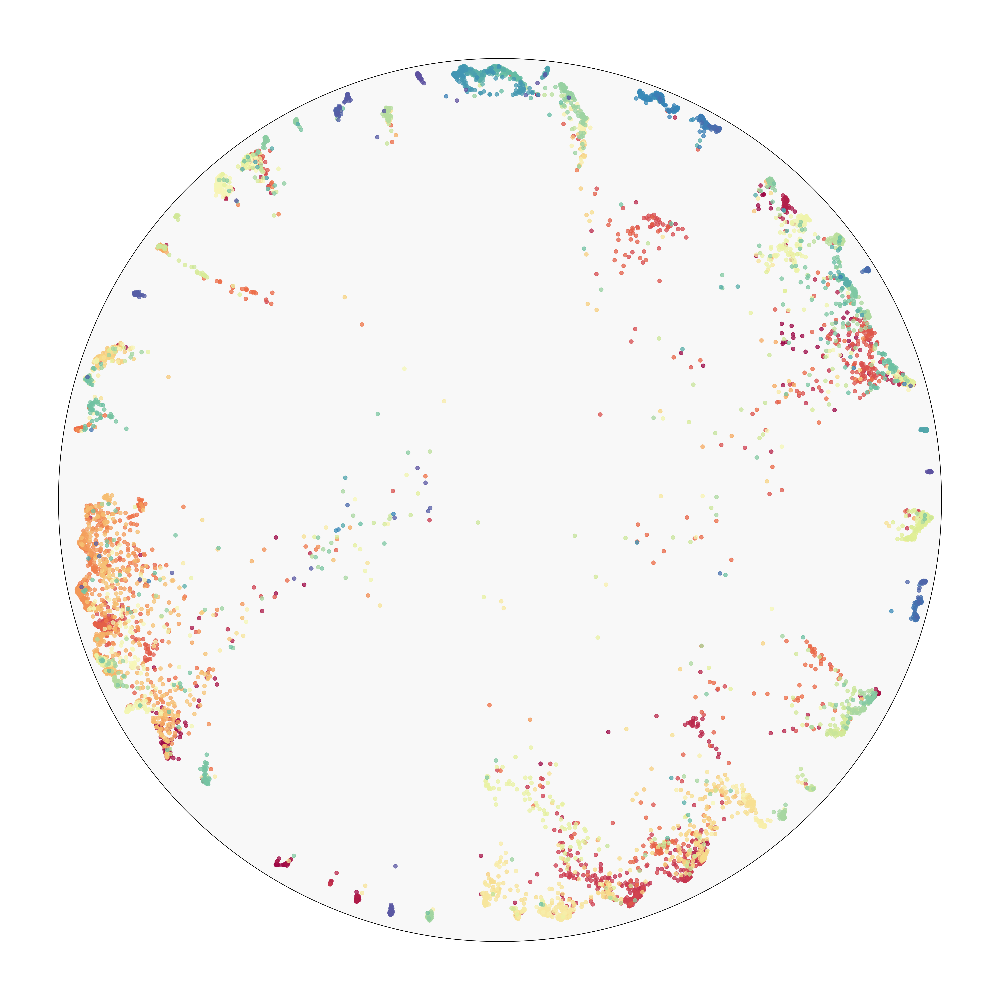

In [62]:
# project back to the Poincare Disk model

disk_x = x / (1 + z)
disk_y = y / (1 + z)

fig = plt.figure(figsize = (30,30), dpi = 300)

ax = fig.add_subplot(111)
ax.set_aspect(1)
ax.set_ylim(-1.1,1.1)
ax.set_xlim(-1.1,1.1) 
boundary = plt.Circle((0,0), 0.98, ec='k', color = 'grey', alpha = 0.05)
ax.add_artist(boundary)
boundary = plt.Circle((0,0), 0.98, ec='k', fc = 'none')
ax.add_artist(boundary)
ax.scatter(disk_x, disk_y, c=label, cmap='Spectral', alpha = 0.75, s = 40)


ax.axis('off');

## Plotting real images

I would like to suggest this by setting slices of each class while plotting the scatter on disk, where here is an example

In [33]:
# add columns of umap
df['umap_x'] = disk_x
df['umap_y'] = disk_y

In [430]:
# set region to plot, while we can also directly sample points in the dataframe as the umap coordinates are saved.

df[(df['umap_x']<  0.5) & (df['umap_x']> 0.4) & (df['umap_y']> 0.1) & (df['umap_y']< 0.5)][-100:]

,embedding,label,image_path,length,umap_x,umap_y
38,"[-0.050403323, 0.02835024, -0.06610227, 0.0353...",0,n02085620_n02085620_7440.JPEG_320_45_486_209.j...,0.996,0.450941,0.297996
45,"[-0.09988028, -0.014982354, 0.021839507, 0.040...",0,n02085620_n02085620_8706.JPEG_227_35_372_177.j...,0.996,0.402016,0.326296
1021,"[-0.036516104, 0.005217932, -0.009569176, 0.02...",20,n02091032_n02091032_2113.JPEG_30_270_177_421.j...,0.996,0.491141,0.122199
1089,"[-0.07277446, 0.07355355, 0.011396601, -0.0052...",21,n02091134_n02091134_7467.JPEG_49_24_192_160.jp...,0.996,0.423902,0.294608
1389,"[-0.050157733, 0.031987753, -0.053417593, 0.03...",27,n02092339_n02092339_665.JPEG_200_233_324_356.j...,0.996,0.444842,0.309817
2237,"[-0.030399308, -0.004770339, 0.00964135, 0.063...",44,n02096585_n02096585_6390.JPEG_21_62_179_225.jp...,0.996,0.449570,0.118524
4593,"[-0.035624497, 0.013765228, -0.023035064, 0.05...",91,n02108089_n02108089_7237.JPEG_281_136_456_299....,0.996,0.419424,0.172900
4788,"[-0.057403415, 0.07329501, 0.060128137, 0.0301...",95,n02109047_n02109047_5860.JPEG_73_90_242_237.jp...,0.996,0.429142,0.256054
4844,"[-0.03390957, 0.010968682, -0.023082376, 0.045...",96,n02109525_n02109525_74616.JPEG_188_94_314_220....,0.996,0.477720,0.148396
5604,"[-0.072515875, 0.07854198, 0.04031591, 0.08714...",112,n02113023_n02113023_12124.JPEG_168_37_353_208....,0.996,0.493183,0.499228


In [392]:
# can also plot with specific class by their indices
i = 13
indices = df.index[df['label'] == i].tolist()

In [ ]:
# sampled index saved here
index = 4788

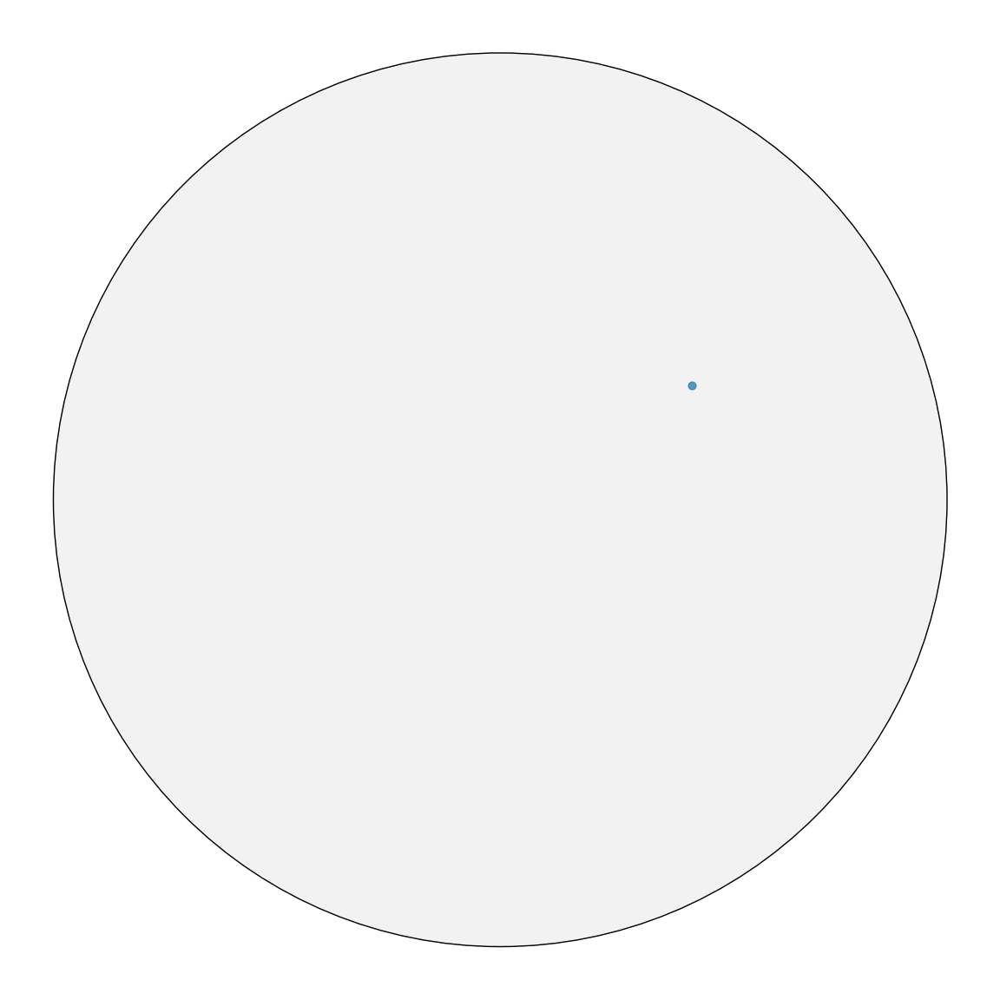

In [431]:
# for a further 

disk_x = x / (1 + z)
disk_y = y / (1 + z)

fig = plt.figure(figsize = (15,15), dpi = 100)

ax = fig.add_subplot(111)
ax.set_aspect(1)
ax.set_ylim(-1.1,1.1)
ax.set_xlim(-1.1,1.1) 
boundary = plt.Circle((0,0), 1, ec='k', color = 'grey', alpha = 0.1)
ax.add_artist(boundary)
boundary = plt.Circle((0,0), 1, ec='k', fc = 'none')
ax.add_artist(boundary)

# pick as many as we want in a single class, and to confirm the exact place, please use only one index
#ax.scatter(disk_x[indices], disk_y[indices], cmap='Spectral', alpha = 0.75, s = 40)

ax.scatter(disk_x[index], disk_y[index], cmap='Spectral', alpha = 0.75, s = 40)
ax.axis('off');

#plt.savefig('your_save_path'+'/umap/' + df['image_path'].iloc[idx])

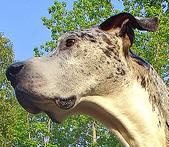

In [434]:
# plot and save the image for that index
data_path= '/proj/rcs-ssd/ll3504/datasets/animal_faces_test_50/'
image_path = df['image_path'].iloc[index].replace('_','/',1)
figure = Image.open(data_path+image_path).convert('RGB')
figure
# figure.save('your_path_here' +  df['image_path'].iloc[idx] + '.jpg')

# For  $\mathcal{W^+}$ space 

In [19]:
# resize the embeddings from [18,512] to 18*512
for i in euc_embed:
    i = i.resize([18*512])

In [20]:
# similar, but notice here embed is substituted by euc_embed
df = pd.DataFrame(list(zip(euc_embed, label, im_path)), columns = ['embedding', 'label', 'image_path'])
df['label'] = df['label'].astype('int')

In [23]:
%%time
mapper = umap.UMAP().fit(euc_embed)

/home/ll3504/anaconda3/envs/psp_env/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


CPU times: user 9min 22s, sys: 21.1 s, total: 9min 43s
Wall time: 40.3 s


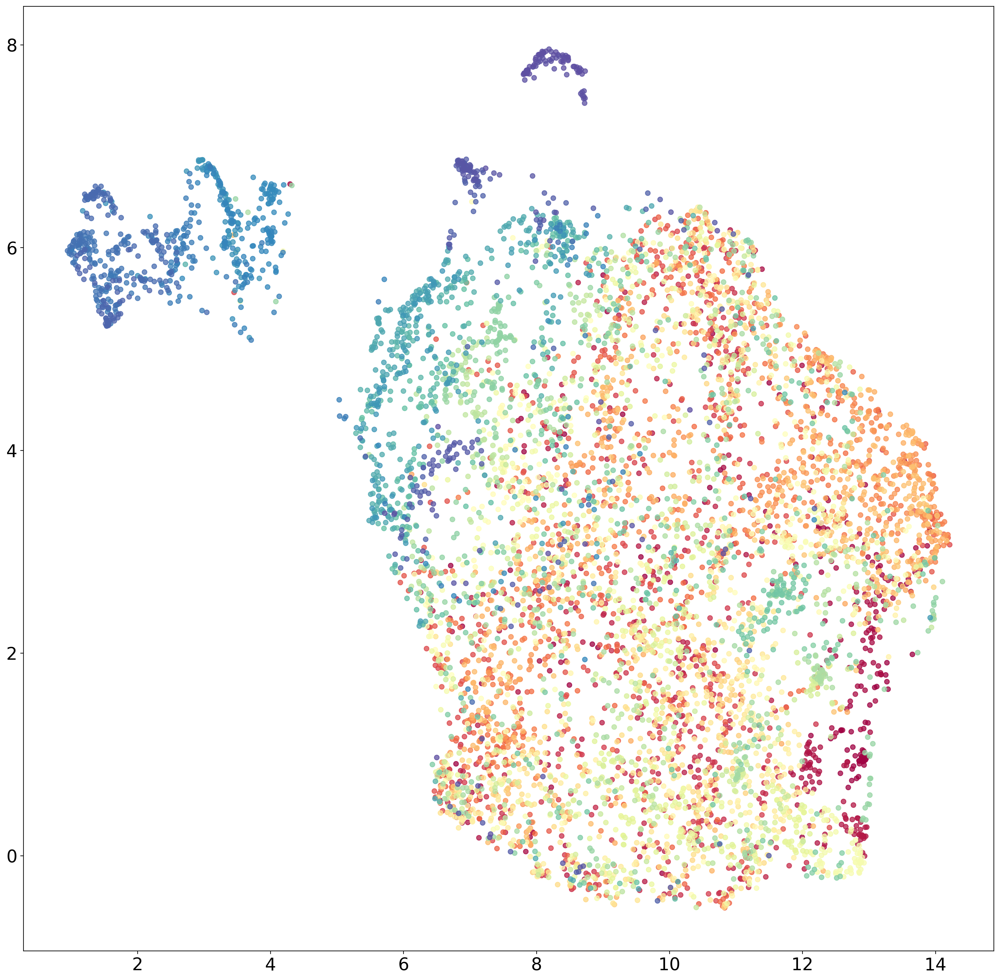

In [57]:
import matplotlib 
from matplotlib.pyplot import figure
matplotlib.rc('xtick', labelsize=30) 
matplotlib.rc('ytick', labelsize=30) 
figure(figsize=(20,20), dpi=300)
plt.scatter(mapper.embedding_.T[0],
            mapper.embedding_.T[1],
            c=label, cmap='Spectral', alpha = 0.75, s = 30)

#plt.axis('off')

In [34]:
df['umap_x'] = mapper.embedding_.T[0]
df['umap_y'] = mapper.embedding_.T[1]

In [164]:
x = 11
y = 4.3

df[(df['umap_x']> x - 0.1) &
   (df['umap_x']< x + 0.1) &
   (df['umap_y']> y - 0.1 ) & 
   (df['umap_y']< y + 0.1)]

,embedding,label,image_path,umap_x,umap_y
694,"[1.7575346, 2.2060208, -0.4004633, -0.20955789...",13,n02088632_n02088632_912.JPEG_127_9_212_91.jpg....,11.065856,4.239328
879,"[1.9642081, 2.3811817, -0.2942568, -0.04363278...",17,n02090379_n02090379_4318.JPEG_282_136_459_293....,10.936076,4.363520
1243,"[2.0462031, 2.3673437, -0.35691065, -0.1772680...",24,n02091635_n02091635_783.JPEG_67_4_105_47.jpg.JPEG,10.901170,4.241794
1411,"[2.1665866, 2.5612578, -0.40805513, -0.2623638...",28,n02093256_n02093256_17347.JPEG_208_51_391_220....,10.995493,4.304039
2924,"[1.9989753, 2.2893581, -0.14030169, -0.1220315...",58,n02099849_n02099849_415.JPEG_148_9_324_209.jpg...,10.931611,4.383489
5893,"[1.8979512, 2.2967591, -0.11775383, -0.4232932...",117,n02113978_n02113978_7882.JPEG_101_152_292_377....,10.904641,4.252264


In [167]:
# random sample image is also available, here is for example only
idx = 1411 

10.995493 4.3040385


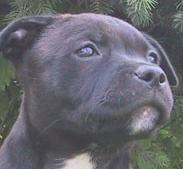

In [168]:
# print umap coordinates
print(mapper.embedding_.T[0][idx],mapper.embedding_.T[1][idx])

data_path= '/proj/rcs-ssd/ll3504/datasets/animal_faces_test_50/'
image_path = df['image_path'].iloc[idx].replace('_','/',1)
figure = Image.open(data_path+image_path).convert('RGB')
figure